In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree, DecisionTreeRegressor
from sklearn.preprocessing import OneHotEncoder, LabelBinarizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.inspection import PartialDependenceDisplay
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.inspection import PartialDependenceDisplay

In [2]:
df = pd.read_csv('youth_data.csv')

In [3]:
df.head()

,Unnamed: 0,iralcfy,irmjfy,ircigfm,IRSMKLSS30N,iralcfm,irmjfm,ircigage,irsmklsstry,iralcage,...,eduschlgo,EDUSCHGRD2,eduskpcom,imother,ifather,income,govtprog,POVERTY3,PDEN10,COUTYP4
0,5,993,991,91,91,93.0,91.0,991,991,12,...,1,5,0,1,1,4,2,3,2,2
1,21,991,991,91,91,91.0,91.0,991,991,991,...,1,5,0,1,1,4,2,3,1,1
2,25,993,993,93,91,93.0,93.0,13,991,13,...,1,4,0,1,1,4,1,3,1,1
3,32,991,991,91,91,91.0,91.0,991,991,991,...,1,7,0,1,1,2,2,1,2,2
4,42,991,991,91,91,91.0,91.0,991,991,991,...,1,3,0,1,1,4,2,3,2,2


In [4]:
# WE WANT TO KNOW IF THERE'S IMPACT OF PARENT ECONOMICAL THINGS ON IF YOUTH WILL TRY MARIAUANA OR NOT

In [5]:
df.columns

Index(['Unnamed: 0', 'iralcfy', 'irmjfy', 'ircigfm', 'IRSMKLSS30N', 'iralcfm',
       'irmjfm', 'ircigage', 'irsmklsstry', 'iralcage', 'irmjage', 'mrjflag',
       'alcflag', 'tobflag', 'alcydays', 'mrjydays', 'alcmdays', 'mrjmdays',
       'cigmdays', 'smklsmdays', 'schfelt', 'tchgjob', 'avggrade', 'stndscig',
       'stndsmj', 'stndalc', 'stnddnk', 'parchkhw', 'parhlphw', 'PRCHORE2',
       'PRLMTTV2', 'parlmtsn', 'PRGDJOB2', 'PRPROUD2', 'argupar', 'YOFIGHT2',
       'YOGRPFT2', 'YOHGUN2', 'YOSELL2', 'YOSTOLE2', 'YOATTAK2', 'PRPKCIG2',
       'PRMJEVR2', 'prmjmo', 'PRALDLY2', 'YFLPKCG2', 'YFLTMRJ2', 'yflmjmo',
       'YFLADLY2', 'FRDPCIG2', 'FRDMEVR2', 'frdmjmon', 'FRDADLY2', 'talkprob',
       'PRTALK3', 'PRBSOLV2', 'PREVIOL2', 'PRVDRGO2', 'GRPCNSL2', 'PREGPGM2',
       'YTHACT2', 'DRPRVME3', 'ANYEDUC3', 'rlgattd', 'rlgimpt', 'rlgdcsn',
       'rlgfrnd', 'irsex', 'NEWRACE2', 'HEALTH2', 'eduschlgo', 'EDUSCHGRD2',
       'eduskpcom', 'imother', 'ifather', 'income', 'govtprog', 'POVERT

Technical Requirements
You must include one example of each of the following problem types:   

- binary classification (e.g. has or has not used cigarettes)
- multi-class classification (e.g. differentiate between seldom, sometimes, and frequent marijuana use)
- regression (e.g. how many days per year a person has used alcohol)

Let's try to answer the question if person has or has not tried mariuana based on various factors. 


To answer this question we need to be certain about what kinds of predictors we want to use for this model


In [6]:
df.shape

(5500, 80)

There are 5500 records and 80 variables. 

We will first try to do binary classification using this dataset

- Question we are trying to answer here is if person have tried mariuana or not

Let's find missing values in the dateset

* PRTALK3 RC-TALKED WITH PARENT ABOUT DANGER TOB/ALC/DRG
* PRBSOLV2 RC-PARTICIPATED IN PRBSLV/COMMSKILL/SELFESTEEM GROUP
* rlgattd RC-NUMBER TIMES ATTEND RELIGIOUS SERVICES IN PST YR (1 -- 25 or more , 2 --less than 25)
* rlgimpt - RC-RELIGIOUS BELIEFS VERY IMPORTANT IN LIFE
* rlgdcsn - RC-RELIGIOUS BELIEFS INFLUENCE LIFE DECISIONS
* rlgfrnd - RC-IMPORTANT FOR FRIENDS TO SHARE RELIGIOUS BELIEFS
* EDUSCHGRD2 - WHAT GRADE IN NOW/WILL BE IN
* PRGDJOB2 - PARENTS TELL YTH HAD DONE GOOD JOB IN PST YR
* YOFIGHT2 - RC-YOUTH HAD SERIOUS FIGHT AT SCHOOL/WORK
* argupar - RC-TIMES ARGUED/HAD A FIGHT WITH ONE PARENT IN PST YR
* PRPROUD2 - RC-PARENTS TELL YTH PROUD OF THINGS DONE IN PST YR
* schfelt - RC-HOW YTH FELT: ABOUT GOING TO SCHOOL IN PST YR
* parchkhw - RC-PARENTS CHECK IF HOMEWORK DONE IN PST YR
* eduskpcom -  HOW MANY DAYS MISSED SCHOOL FROM SKIPPING (COMBINED)

In [7]:
df_final = df[['EDUSCHGRD2',  'eduskpcom','PRTALK3','PRBSOLV2',\
                       'rlgattd','rlgimpt','rlgdcsn','rlgfrnd','PRGDJOB2','YOFIGHT2',\
                       'argupar', 'PRPROUD2','schfelt','parchkhw','alcflag','mrjflag', 'tobflag','iralcage']].copy()

In [8]:
# create a dictionary to map old variable names to new variable names
new_names = {
    'PRTALK3': 'parent_talked_about_substance_use',
    'PRBSOLV2': 'participated_in_skills_group',
    'rlgattd': 'religious_service_attendance',
    'rlgimpt': 'religious_beliefs_importance',
    'rlgdcsn': 'religious_beliefs_influence_decisions',
    'rlgfrnd': 'religious_beliefs_shared_with_friends',
    'EDUSCHGRD2': 'education_grade_level',
    'PRGDJOB2': 'parent_praise_for_youth',
    'YOFIGHT2': 'serious_fight_at_school_or_work',
    'argupar': 'arguments_or_fights_with_parent',
    'PRPROUD2': 'parent_pride_for_youth',
    'schfelt': 'youth_feelings_about_school',
    'parchkhw': 'homework_monitoring_by_parent',
    'eduskpcom': 'days_missed_school_from_skipping',
    'alcflag': 'alcohol_use_flag',
    'mrjflag': 'marijuana_use_flag',
    'tobflag': 'tobacco_use_flag',
    'iralcfy': 'alcohol_frequency_past_year',
    'iralcage' : 'age_first_alcohol_use'
}

# rename the columns in the dataframe
df_final = df_final.rename(columns=new_names)

In [9]:
df_final

,education_grade_level,days_missed_school_from_skipping,parent_talked_about_substance_use,participated_in_skills_group,religious_service_attendance,religious_beliefs_importance,religious_beliefs_influence_decisions,religious_beliefs_shared_with_friends,parent_praise_for_youth,serious_fight_at_school_or_work,arguments_or_fights_with_parent,parent_pride_for_youth,youth_feelings_about_school,homework_monitoring_by_parent,alcohol_use_flag,marijuana_use_flag,tobacco_use_flag,age_first_alcohol_use
0,5,0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1,1.0,1,0,0,12
1,5,0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1,1.0,0,0,0,991
2,4,0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1,1.0,1,1,1,13
3,7,0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1,1.0,0,0,0,991
4,3,0,NaN,2.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1,1.0,0,0,0,991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5495,7,0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1,1.0,0,0,0,991
5496,6,0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,1,1.0,0,0,0,991
5497,5,0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1,1.0,0,0,0,991
5498,7,0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1,1.0,0,0,0,991


Education grade level was not categorical and there were values which were indicating if person have taken any education or not. We have replaced it in a way that it is binary indicator


If person have taken any education or not. 

In [10]:
# use the replace function to create the new variable
df_final['education_grade_level'] = df_final['education_grade_level'].replace(to_replace=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], value=1)
df_final['education_grade_level'] = df_final['education_grade_level'].replace(to_replace=[99], value=0)

# print the resulting dataframe
df_final['education_grade_level'].value_counts()

1     4752
0      667
98      81
Name: education_grade_level, dtype: int64

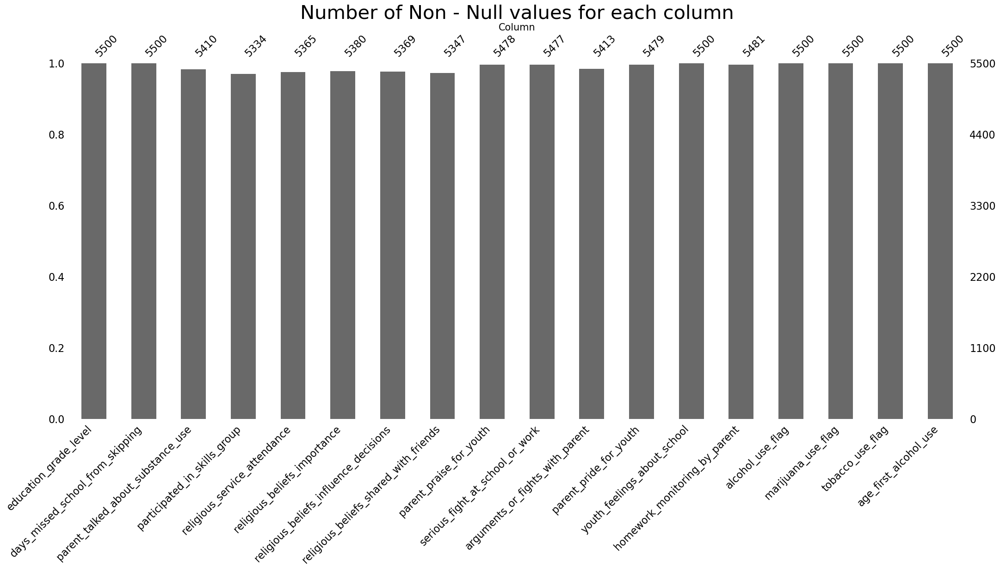

In [11]:
msno.bar(df_final)
plt.title('Number of Non - Null values for each column',fontsize = 30)
plt.ylabel('Count of non-NAN values', fontsize = 15)
plt.xlabel('Column', fontsize = 15);

<AxesSubplot:>

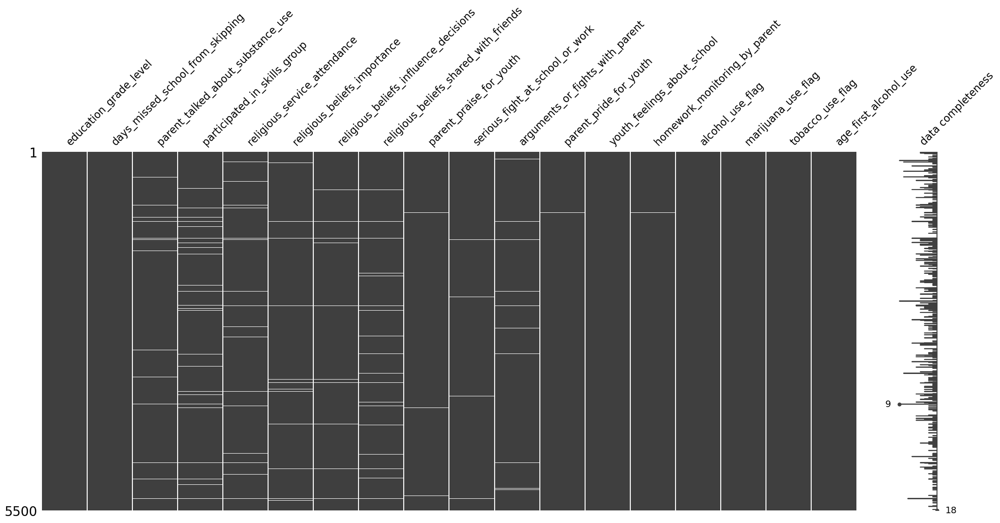

In [12]:
msno.matrix(df_final, labels = True)

We can see that there are missing values for certain columns and by seeing the graph it's interesting to note that the data is not missing at random. There are certain records which have same field missing. We can see how we want to impute that data. 

We can see that the following number of recrods are missing for each of the variable.

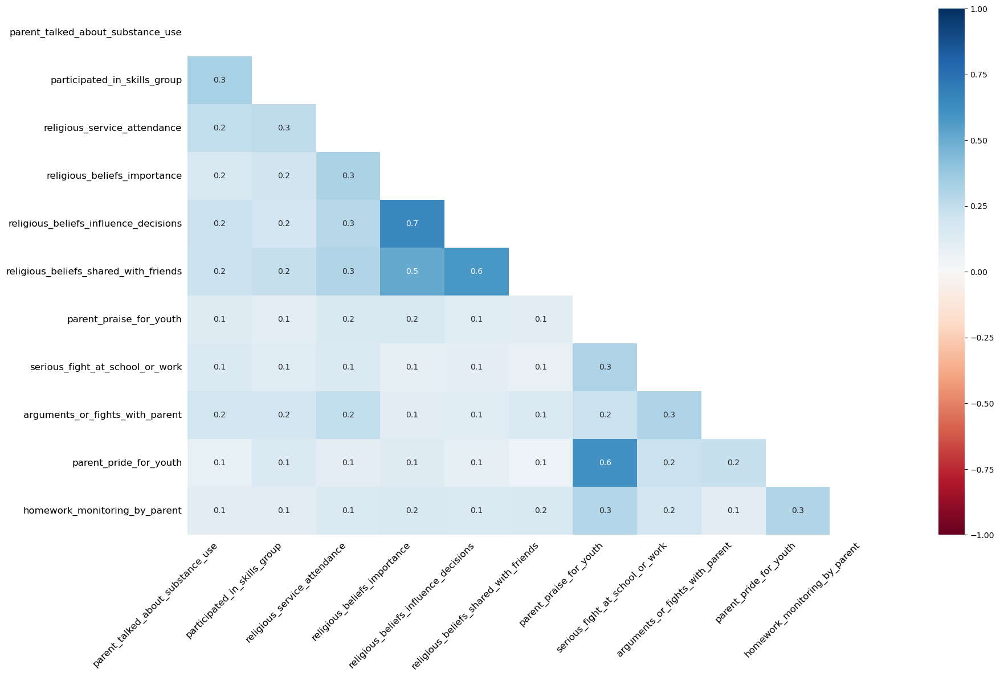

In [13]:
msno.heatmap(df_final, fontsize = 12);

We can also see that there's correlation between the missing values using the missing value heat map. To replace the missing values in the dataset we are using MICE libary

<AxesSubplot:>

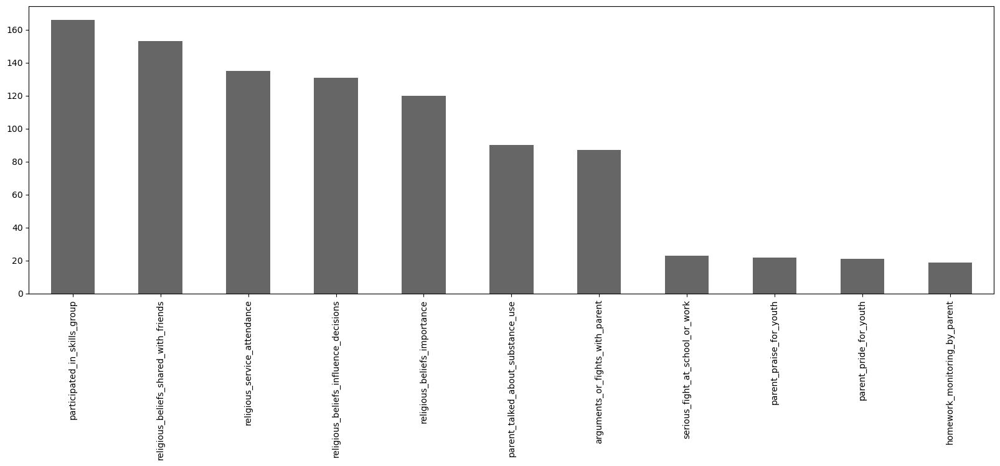

In [14]:
df_final.isna().sum()[df_final.isna().sum()>0].sort_values(ascending = False).plot(kind = 'bar', figsize = (20,6), color = 'k', alpha = 0.6)

<B> Imputated Values </B>

In [15]:
imputer = SimpleImputer(strategy="constant")

In [16]:
df_impute = df_final.copy()

In [17]:
df_impute = pd.DataFrame(imputer.fit_transform(df_impute), columns = df_impute.columns)

In [18]:
df_impute

,education_grade_level,days_missed_school_from_skipping,parent_talked_about_substance_use,participated_in_skills_group,religious_service_attendance,religious_beliefs_importance,religious_beliefs_influence_decisions,religious_beliefs_shared_with_friends,parent_praise_for_youth,serious_fight_at_school_or_work,arguments_or_fights_with_parent,parent_pride_for_youth,youth_feelings_about_school,homework_monitoring_by_parent,alcohol_use_flag,marijuana_use_flag,tobacco_use_flag,age_first_alcohol_use
0,1.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,12.0
1,1.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
2,1.0,0.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,13.0
3,1.0,0.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
4,1.0,0.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5495,1.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
5496,1.0,0.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
5497,1.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
5498,1.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0


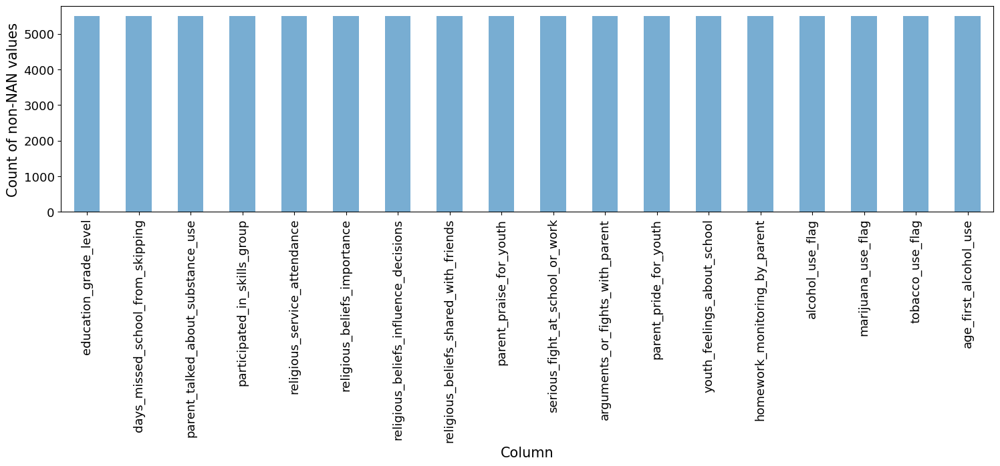

In [19]:
df_impute.notna().sum().plot(kind = 'bar',figsize = (18,4),alpha = 0.6)
plt.xlabel('Column', fontsize = 15)
plt.ylabel('Count of non-NAN values', fontsize = 15)
plt.tick_params(labelsize = 13)

We can see that there are 0 null values in the dataset now

Does religion or parental behavior , religious belief , education and youth behavior in society impacts drinking alcohol?

<B> Define functions </B>

In [20]:
def find_unique_count(frame , column , response):
    print('Number of nan values in the dataset: ', frame[column].isna().sum())
    print('Number of unique values: ' , frame[column].nunique())
    print('Count of each value:\n' ,frame[column].value_counts())
    sns.catplot(data = frame , x = response , hue = column, kind = 'count',palette="pastel", edgecolor=".6")

In [21]:
def convert_to_category(df,col):
    df[col] = df[col].astype('category')


### Binary Classification

In [22]:
df_binary = df_impute[['education_grade_level', 'days_missed_school_from_skipping',
       'parent_talked_about_substance_use', 'participated_in_skills_group',
       'religious_service_attendance', 'religious_beliefs_importance',
       'religious_beliefs_influence_decisions',
       'religious_beliefs_shared_with_friends', 'parent_praise_for_youth',
       'serious_fight_at_school_or_work', 'arguments_or_fights_with_parent',
       'parent_pride_for_youth', 'youth_feelings_about_school',
       'homework_monitoring_by_parent','alcohol_use_flag']].copy()

In [23]:
#function to convert categorical variable into one hot encoded values
def onehotencoding(df, col_name):
    dummy = pd.get_dummies(df[[col_name]])
    res = pd.concat([df, dummy ], axis=1)
    res.drop(col_name,inplace = True,axis = 1)
    return(res)

In [24]:
for col in df_binary.columns[:-1]:
    convert_to_category(df_binary,col)
    df_binary = onehotencoding(df_binary,col)

In [25]:
# Split the dataset into X and y variable
X = df_binary[df_binary.columns.difference(['alcohol_use_flag'])]
y = df_binary['alcohol_use_flag']

In [26]:
# fit decision tree model
tree_mar = DecisionTreeClassifier()
tree_mar.fit(X, y)

DecisionTreeClassifier()

In [27]:
tree_summary = export_text(tree_mar, feature_names=X.columns.tolist())


In [28]:
importances = pd.DataFrame({'feature_name': X.columns, 'importance': tree_mar.feature_importances_})
importances = importances.sort_values('importance', ascending=False).reset_index(drop=True)
print(importances)

                             feature_name  importance
0   parent_talked_about_substance_use_1.0    0.053478
1         youth_feelings_about_school_2.0    0.048302
2    days_missed_school_from_skipping_0.0    0.042280
3        religious_beliefs_importance_2.0    0.040506
4         youth_feelings_about_school_1.0    0.040148
..                                    ...         ...
60  days_missed_school_from_skipping_22.0    0.000000
61            parent_praise_for_youth_0.0    0.000000
62  days_missed_school_from_skipping_25.0    0.000000
63  days_missed_school_from_skipping_16.0    0.000000
64  days_missed_school_from_skipping_13.0    0.000000

[65 rows x 2 columns]


In [29]:
importances[:10]['feature_name']

0    parent_talked_about_substance_use_1.0
1          youth_feelings_about_school_2.0
2     days_missed_school_from_skipping_0.0
3         religious_beliefs_importance_2.0
4          youth_feelings_about_school_1.0
5         participated_in_skills_group_2.0
6         religious_service_attendance_2.0
7      arguments_or_fights_with_parent_2.0
8               parent_pride_for_youth_1.0
9              parent_praise_for_youth_1.0
Name: feature_name, dtype: object

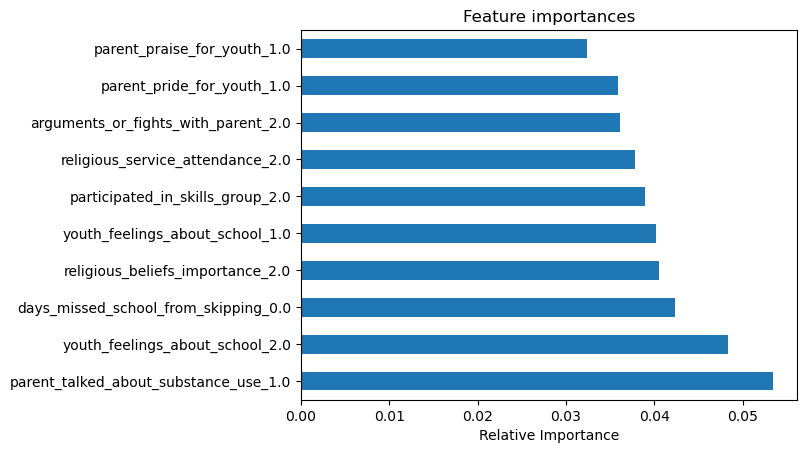

In [30]:
importances[:10].plot(kind='barh')
plt.yticks(range(10),[feature for feature in importances[:10]['feature_name']])
plt.xlabel('Relative Importance')
plt.legend('',frameon=False)
plt.title("Feature importances")
plt.show()


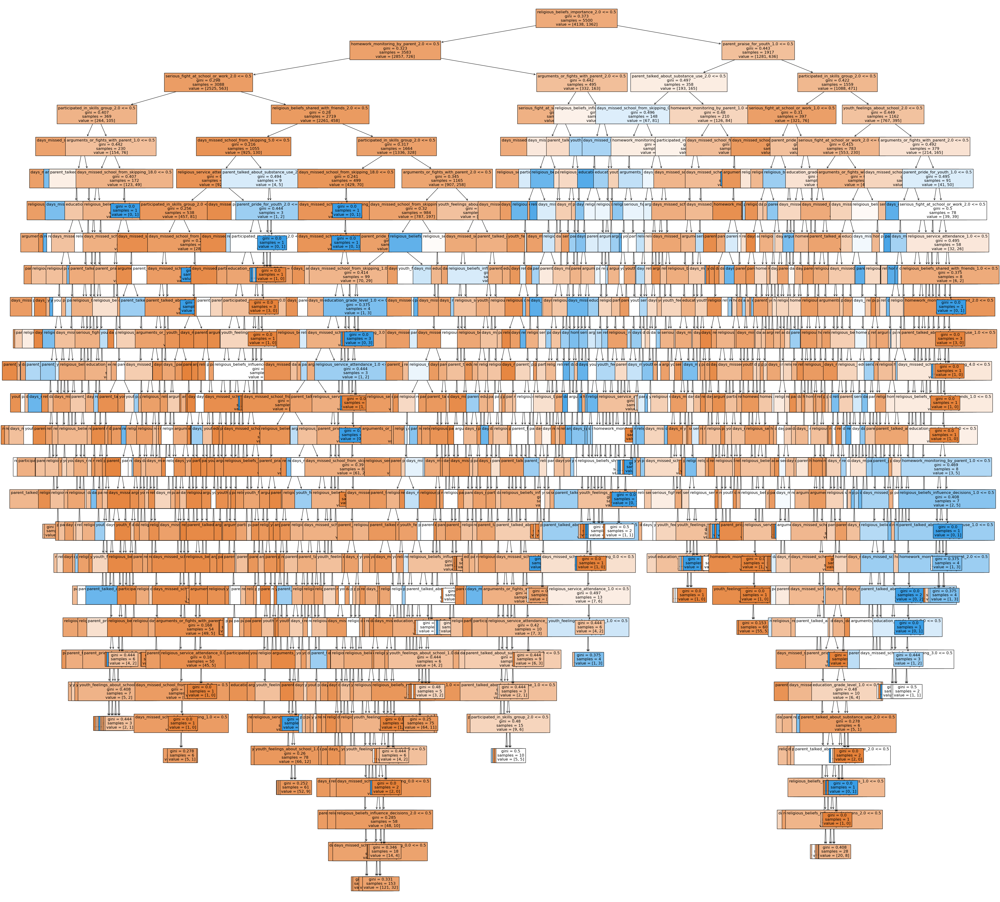

In [31]:
plt.figure(figsize=(50,50))
plot_tree(tree_mar
          , filled=True
          , feature_names=X.columns
          #, class_names=[0, 1]
          , label='all'
          , fontsize=12)
plt.show()

The above output looks too messy to visualize. Let's see what output we are getting after running the model for the training dataset

### Let's try different models to predict the alcohol usage based on various parameters

##### Simple Decision Classifier

###### since the data is imbalanced, we will do stratify sampling and see how it performs

In [32]:
# Split the Data between test and train
X_train, X_test, y_train, y_test = train_test_split(X, y
                                                    , test_size = 0.3
                                                    , random_state = 2,stratify=y)
# fit decision tree model
tree_mar_flag = DecisionTreeClassifier()
tree_mar_flag.fit(X_train, y_train)

# predict on test data
tree_pred = tree_mar_flag.predict(X_test)

# create confusion matrix
confusion_matrix = pd.crosstab(index=tree_pred, columns=y_test, rownames=[''])
print(confusion_matrix)

alcohol_use_flag   0.0  1.0
                           
0.0               1098  317
1.0                143   92


In [33]:
accuracy = tree_mar_flag.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 72.12%


We can see that the model is doing well on class 0 but it is unable to predict the output accurately for the class 1.

#### Let's try Random Forest Classifier and see how it works in the training and test dataset

In [34]:
# Split the Data between test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2, stratify=y)


# create Random Forest model with class_weight parameter
rf_model = RandomForestClassifier()

# fit Random Forest model
rf_model.fit(X_train, y_train)

# predict on test data
rf_pred = rf_model.predict(X_test)

# create confusion matrix
confusion_matrix = pd.crosstab(index=rf_pred, columns=y_test, rownames=[''])
print(confusion_matrix)
accuracy = rf_model.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

alcohol_use_flag   0.0  1.0
                           
0.0               1124  321
1.0                117   88
Accuracy: 73.45%


There's atleast improvement in predicting the output for class 0 . 

### Let's try bagging approach 

In [35]:
# fit Random Forests model
alcohol_bagging = RandomForestClassifier(max_features=X_train.shape[1],random_state = 2)
alcohol_bagging.fit(X_train,y_train)

print("Number of trees:", alcohol_bagging.n_estimators)
print("Number of features tried at each split:",alcohol_bagging.max_features)
print("Training score: {:.2f}%".format(alcohol_bagging.score(X_train,y_train)*100))

Number of trees: 100
Number of features tried at each split: 65
Training score: 87.30%


In [36]:
# Predict values
y_pred_bag = alcohol_bagging.predict(X_test)

confusion_matrix = pd.crosstab(index=y_pred_bag, columns=y_test, rownames=[''])
print(confusion_matrix)

alcohol_use_flag   0.0  1.0
                           
0.0               1099  308
1.0                142  101


In [37]:
# Calculate the accuracy of the decision tree on the test data
accuracy = alcohol_bagging.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 72.73%


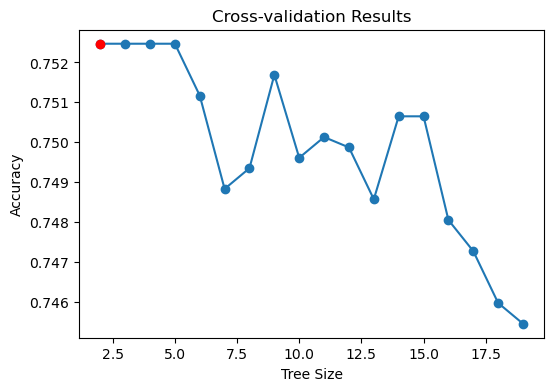

In [38]:
# fit decision tree model
tree_mar = DecisionTreeClassifier(random_state=7)
tree_mar.fit(X_train, y_train)

# cross-validation to determine optimal tree size
params = {'max_leaf_nodes': range(2, 20)}  
cv_mar = GridSearchCV(tree_mar, params, cv=10)
cv_mar.fit(X_train, y_train)
cv_results = cv_mar.cv_results_

# find the best score for max leaf nodes
best_size = cv_mar.best_params_['max_leaf_nodes']
best_score = cv_mar.best_score_

# plot results of cross-validation
plt.figure(figsize=(6, 4))
plt.plot(cv_results["param_max_leaf_nodes"], cv_results["mean_test_score"], 'o-')
plt.plot(best_size, best_score, 'ro-')
plt.xlabel('Tree Size')
plt.ylabel('Accuracy')
plt.title('Cross-validation Results');


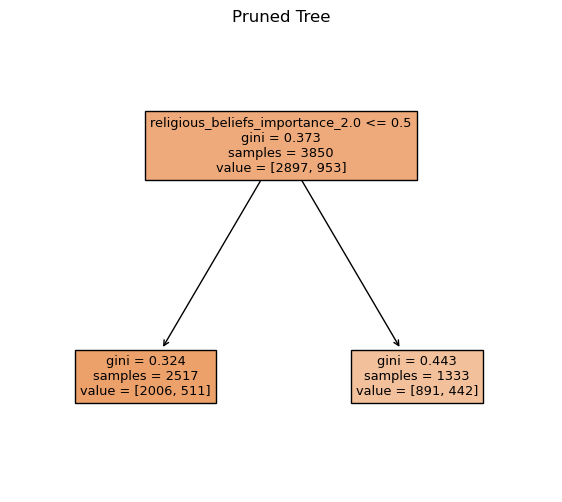

In [39]:
# prune tree using optimal size
prune_mar = DecisionTreeClassifier(max_leaf_nodes=best_size, random_state=7)
prune_mar.fit(X_train, y_train)

# plot pruned tree
plt.figure(figsize=(7,6))
plt.title('Pruned Tree')
plot_tree(prune_mar, feature_names=X_train.columns, filled=True);
plt.title('Pruned Tree');

In [40]:
# obtain predicted labels for test set
y_pred = prune_mar.predict(X_test)

# create confusion matrix
confusion_matrix = pd.crosstab(index=y_pred, columns=y_test, rownames=[''])
print(confusion_matrix)

alcohol_use_flag   0.0  1.0
                           
0.0               1241  409


In [41]:
# Calculate the accuracy of the decision tree on the test data
accuracy = prune_mar.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 75.21%


In [42]:
# fit Gradient Boosting model
boost_alcohol = GradientBoostingClassifier(n_estimators=5000, max_depth=4
                                         , random_state=1)
boost_alcohol.fit(X_train, y_train)

GradientBoostingClassifier(max_depth=4, n_estimators=5000, random_state=1)

In [43]:
# create a dataframe of feature importances and their corresponding column names
importances_boost_alcohol = pd.DataFrame({'Feature': X_train.columns, 'Importance': boost_alcohol.feature_importances_})
importances_boost_alcohol = importances_boost_alcohol.sort_values('Importance', ascending=False).reset_index(drop=True)

# display the table
print(importances_boost_alcohol)

                                      Feature  Importance
0         arguments_or_fights_with_parent_2.0    0.055848
1            religious_beliefs_importance_2.0    0.053520
2           homework_monitoring_by_parent_2.0    0.049237
3   religious_beliefs_influence_decisions_2.0    0.044102
4         serious_fight_at_school_or_work_2.0    0.039174
..                                        ...         ...
60      days_missed_school_from_skipping_11.0    0.000946
61      days_missed_school_from_skipping_22.0    0.000590
62      days_missed_school_from_skipping_13.0    0.000577
63      days_missed_school_from_skipping_14.0    0.000477
64      days_missed_school_from_skipping_16.0    0.000111

[65 rows x 2 columns]


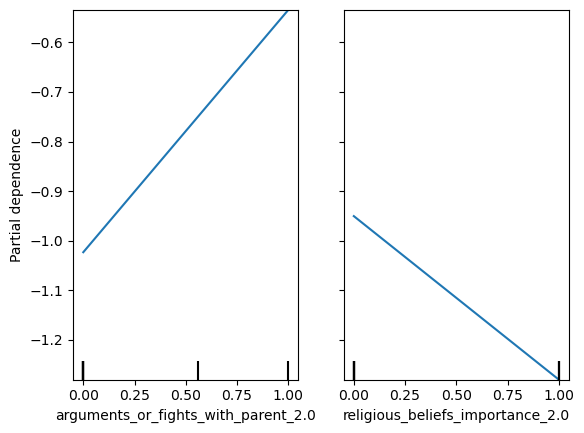

In [44]:
PartialDependenceDisplay.from_estimator(boost_alcohol, X_train, ['arguments_or_fights_with_parent_2.0', 'religious_beliefs_importance_2.0']);

In [45]:
# obtain predicted labels for test set
y_pred = boost_alcohol.predict(X_test)

# create confusion matrix
confusion_matrix = pd.crosstab(index=y_pred, columns=y_test, rownames=[''])
print(confusion_matrix)

alcohol_use_flag   0.0  1.0
                           
0.0               1073  295
1.0                168  114


## Multiclass classification

For multiclass classification we will merge the colum output of alcohol flag,tobacco flag and marijuana flag

In [46]:
df_impute

,education_grade_level,days_missed_school_from_skipping,parent_talked_about_substance_use,participated_in_skills_group,religious_service_attendance,religious_beliefs_importance,religious_beliefs_influence_decisions,religious_beliefs_shared_with_friends,parent_praise_for_youth,serious_fight_at_school_or_work,arguments_or_fights_with_parent,parent_pride_for_youth,youth_feelings_about_school,homework_monitoring_by_parent,alcohol_use_flag,marijuana_use_flag,tobacco_use_flag,age_first_alcohol_use
0,1.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,12.0
1,1.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
2,1.0,0.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,13.0
3,1.0,0.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
4,1.0,0.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5495,1.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
5496,1.0,0.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
5497,1.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0
5498,1.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0


In [47]:
# create a dictionary to map the values
mapping = {1: 1, 2: 2, 3: 3}

# create a list of the columns to use
columns = ['alcohol_use_flag', 'marijuana_use_flag', 'tobacco_use_flag']

# create a new column using numpy.select
df_impute['substance_use_flag'] = np.select(
    condlist=[df_impute[col] == 1 for col in columns],
    choicelist=[mapping[i] for i in range(1, len(columns) + 1)],
    default=0
)

In [48]:
df_impute['substance_use_flag'].value_counts()

0    3902
1    1362
2     142
3      94
Name: substance_use_flag, dtype: int64

In [49]:
df_multi = df_impute[['education_grade_level', 'days_missed_school_from_skipping',
       'parent_talked_about_substance_use', 'participated_in_skills_group',
       'religious_service_attendance', 'religious_beliefs_importance',
       'religious_beliefs_influence_decisions',
       'religious_beliefs_shared_with_friends', 'parent_praise_for_youth',
       'serious_fight_at_school_or_work', 'arguments_or_fights_with_parent',
       'parent_pride_for_youth', 'youth_feelings_about_school',
       'homework_monitoring_by_parent','substance_use_flag']].copy()

In [50]:
def convert_to_category(df,col):
    df[col] = df[col].astype('category')


In [51]:
for col in df_multi.columns[:-1]:
    convert_to_category(df_multi,col)
    df_multi = onehotencoding(df_multi,col)

In [52]:
X = df_multi[df_multi.columns.difference(['substance_use_flag'])]
y = df_multi['substance_use_flag']

In [53]:
# fit decision tree model
tree_mar = DecisionTreeClassifier()
tree_mar.fit(X, y)

DecisionTreeClassifier()

In [54]:
tree_summary = export_text(tree_mar, feature_names=X.columns.tolist())


In [55]:
importances = pd.DataFrame({'feature_name': X.columns, 'importance': tree_mar.feature_importances_})
importances = importances.sort_values('importance', ascending=False).reset_index(drop=True)
print(importances)

                             feature_name  importance
0   parent_talked_about_substance_use_2.0    0.045986
1         youth_feelings_about_school_2.0    0.043591
2     arguments_or_fights_with_parent_2.0    0.042422
3    days_missed_school_from_skipping_0.0    0.041216
4        religious_beliefs_importance_2.0    0.039368
..                                    ...         ...
60  days_missed_school_from_skipping_22.0    0.000600
61  days_missed_school_from_skipping_20.0    0.000516
62  days_missed_school_from_skipping_12.0    0.000293
63  days_missed_school_from_skipping_16.0    0.000000
64  days_missed_school_from_skipping_13.0    0.000000

[65 rows x 2 columns]


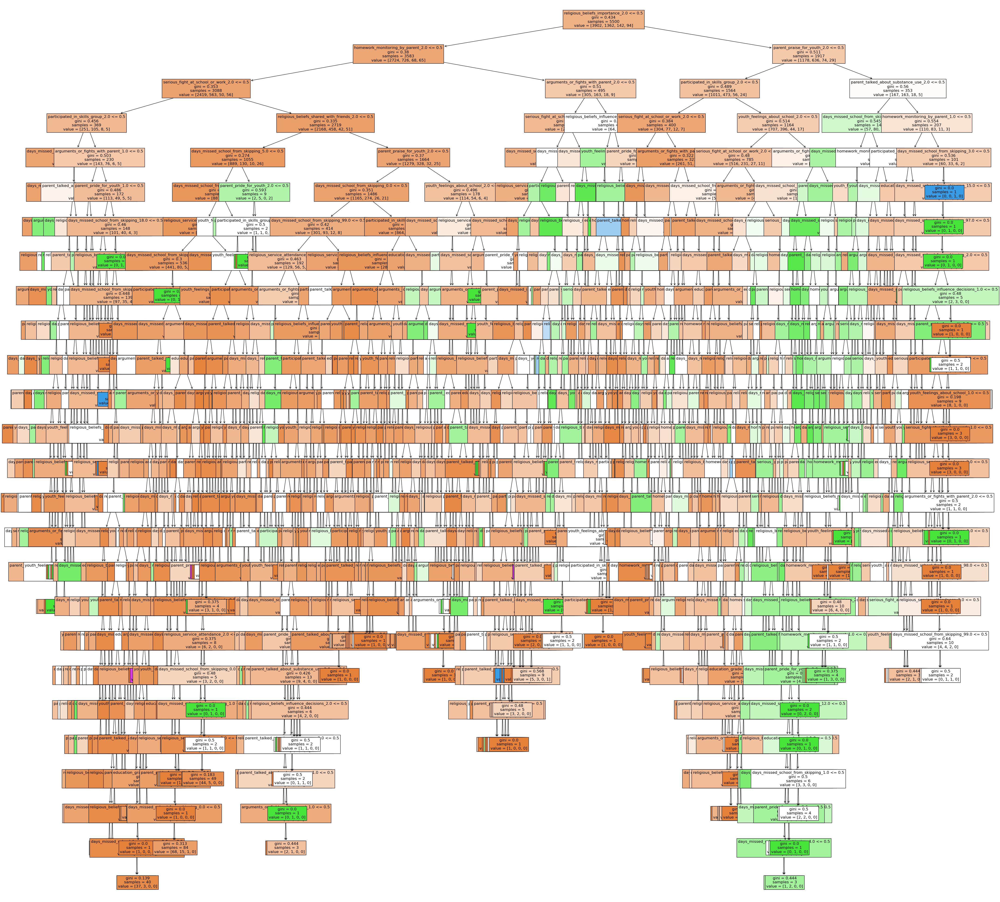

In [56]:
plt.figure(figsize=(50,50))
plot_tree(tree_mar
          , filled=True
          , feature_names=X.columns
          #, class_names=[0, 1]
          , label='all'
          , fontsize=12)
plt.show()

The above output looks too messy to visualize. Let's see what output we are getting after running the model for the training dataset

### Let's try different models to predict the alcohol usage based on various parameters

##### Simple Decision Classifier

###### since the data is imbalanced, we will do stratify sampling and see how it performs

In [57]:
output = ['No_Substance_Use','Alcohol_Use','Marijuana_Use','Tobacco_Use']

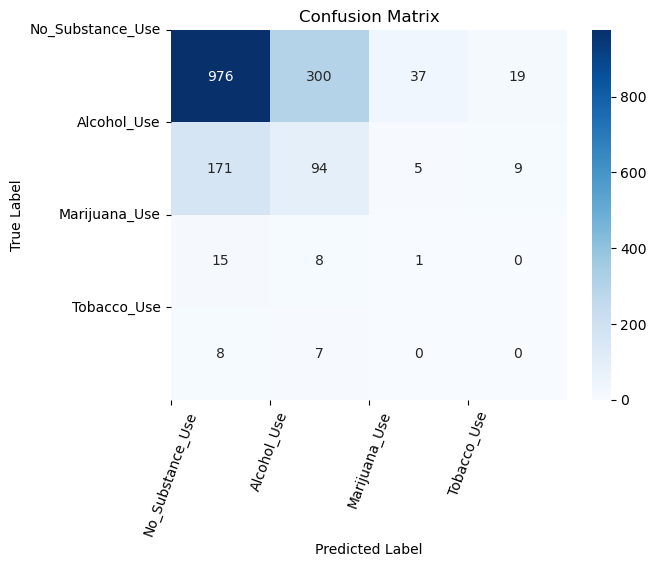

In [58]:
# Split the Data between test and train
X_train, X_test, y_train, y_test = train_test_split(X, y
                                                    , test_size = 0.3
                                                    , random_state = 2,stratify=y)
# fit decision tree model
tree_mar_flag = DecisionTreeClassifier()
tree_mar_flag.fit(X_train, y_train)

# predict on test data
tree_pred = tree_mar_flag.predict(X_test)

# create confusion matrix
confusion_matrix = pd.crosstab(index=tree_pred, columns=y_test, rownames=[''])
# create a heatmap of the confusion matrix
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", fmt="d")

# add labels to the plot
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.yticks(range(4),[out for out in output],rotation = 0)
plt.xticks(range(4),[out for out in output],rotation = 70)
plt.show()

We can see that the model is doing well on class 0 but it is unable to predict the output accurately for the class 1.

#### Let's try Random Forest Classifier and see how it works in the training and test dataset

In [59]:
# Split the Data between test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2, stratify=y)


# create Random Forest model with class_weight parameter
rf_model = RandomForestClassifier()

# fit Random Forest model
rf_model.fit(X_train, y_train)

# predict on test data
rf_pred = rf_model.predict(X_test)

# create confusion matrix
confusion_matrix = pd.crosstab(index=rf_pred, columns=y_test, rownames=[''])
print(confusion_matrix)


substance_use_flag     0    1   2   3
                                     
0                   1028  309  38  20
1                    135   92   5   8
2                      5    5   0   0
3                      2    3   0   0


There's atleast improvement in predicting the output for class 0 . 

In [60]:
accuracy = rf_model.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 67.88%


### Let's try bagging approach 

In [61]:
# fit Random Forests model
multi_bagging = RandomForestClassifier(max_features=X_train.shape[1],random_state = 2)
multi_bagging.fit(X_train,y_train)

print("Number of trees:", multi_bagging.n_estimators)
print("Number of features tried at each split:",multi_bagging.max_features)
print("Training score: {:.2f}%".format(multi_bagging.score(X_train,y_train)*100))

Number of trees: 100
Number of features tried at each split: 65
Training score: 86.21%


In [62]:
# Predict values
y_pred_bag = multi_bagging.predict(X_test)

confusion_matrix = pd.crosstab(index=y_pred_bag, columns=y_test, rownames=[''])
print(confusion_matrix)

substance_use_flag    0    1   2   3
                                    
0                   995  309  36  19
1                   165   91   7   9
2                     4    5   0   0
3                     6    4   0   0


In [63]:
# Calculate the accuracy of the decision tree on the test data
accuracy = multi_bagging.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 65.82%


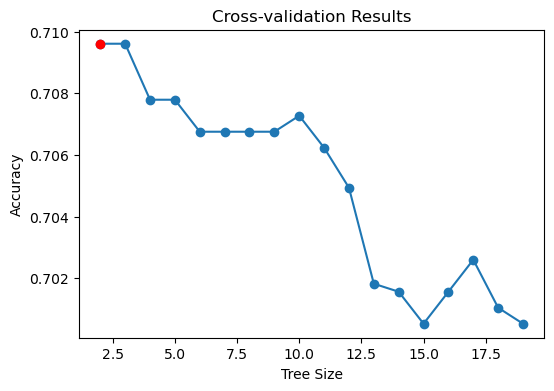

In [64]:
# fit decision tree model
tree_mar = DecisionTreeClassifier(random_state=7)
tree_mar.fit(X_train, y_train)

# cross-validation to determine optimal tree size
params = {'max_leaf_nodes': range(2, 20)}  
cv_mar = GridSearchCV(tree_mar, params, cv=10)
cv_mar.fit(X_train, y_train)
cv_results = cv_mar.cv_results_

# find the best score for max leaf nodes
best_size = cv_mar.best_params_['max_leaf_nodes']
best_score = cv_mar.best_score_

# plot results of cross-validation
plt.figure(figsize=(6, 4))
plt.plot(cv_results["param_max_leaf_nodes"], cv_results["mean_test_score"], 'o-')
plt.plot(best_size, best_score, 'ro-')
plt.xlabel('Tree Size')
plt.ylabel('Accuracy')
plt.title('Cross-validation Results');


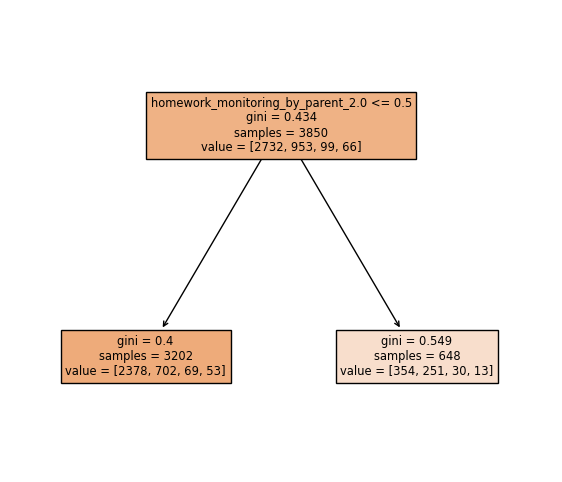

In [65]:
# prune tree using optimal size
prune_mar = DecisionTreeClassifier(max_leaf_nodes=best_size, random_state=7)
prune_mar.fit(X_train, y_train)

# plot pruned tree
plt.figure(figsize=(7,6))
plt.title('Pruned Tree')
plot_tree(prune_mar, feature_names=X_train.columns, filled=True);

In [66]:
# obtain predicted labels for test set
y_pred = prune_mar.predict(X_test)

# create confusion matrix
confusion_matrix = pd.crosstab(index=y_pred, columns=y_test, rownames=[''])
print(confusion_matrix)

substance_use_flag     0    1   2   3
                                     
0                   1170  409  43  28


In [67]:
# Calculate the accuracy of the decision tree on the test data
accuracy = prune_mar.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 70.91%


In [68]:
# fit Gradient Boosting model
boost = GradientBoostingClassifier(n_estimators=5000, max_depth=4
                                         , random_state=1)
boost.fit(X_train, y_train)

GradientBoostingClassifier(max_depth=4, n_estimators=5000, random_state=1)

In [69]:
# create a dataframe of feature importances and their corresponding column names
importances_boost = pd.DataFrame({'Feature': X_train.columns, 'Importance': boost.feature_importances_})
importances_boost = importances_boost.sort_values('Importance', ascending=False).reset_index(drop=True)

# display the table
print(importances_boost)

                                  Feature  Importance
0       homework_monitoring_by_parent_2.0    0.062809
1        religious_beliefs_importance_2.0    0.061512
2     arguments_or_fights_with_parent_2.0    0.060894
3        participated_in_skills_group_2.0    0.038284
4     serious_fight_at_school_or_work_2.0    0.036727
..                                    ...         ...
60  days_missed_school_from_skipping_11.0    0.000849
61  days_missed_school_from_skipping_22.0    0.000768
62  days_missed_school_from_skipping_14.0    0.000647
63  days_missed_school_from_skipping_16.0    0.000149
64  days_missed_school_from_skipping_13.0    0.000097

[65 rows x 2 columns]


In [70]:
# obtain predicted labels for test set
y_pred = boost.predict(X_test)

# create confusion matrix
confusion_matrix = pd.crosstab(index=y_pred, columns=y_test, rownames=[''])
print(confusion_matrix)

substance_use_flag    0    1   2   3
                                    
0                   963  292  34  20
1                   187  102   9   8
2                    11   10   0   0
3                     9    5   0   0


In [71]:
accuracy = boost.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 64.55%


## Regression Problem 

In [72]:
df_impute

,education_grade_level,days_missed_school_from_skipping,parent_talked_about_substance_use,participated_in_skills_group,religious_service_attendance,religious_beliefs_importance,religious_beliefs_influence_decisions,religious_beliefs_shared_with_friends,parent_praise_for_youth,serious_fight_at_school_or_work,arguments_or_fights_with_parent,parent_pride_for_youth,youth_feelings_about_school,homework_monitoring_by_parent,alcohol_use_flag,marijuana_use_flag,tobacco_use_flag,age_first_alcohol_use,substance_use_flag
0,1.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,12.0,1
1,1.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0,0
2,1.0,0.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,13.0,1
3,1.0,0.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0,0
4,1.0,0.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5495,1.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0,0
5496,1.0,0.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0,0
5497,1.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0,0
5498,1.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,991.0,0


In [73]:
df_regressor = df_impute.copy()

In [74]:
df_regressor['age_first_alcohol_use'] = df_regressor['age_first_alcohol_use'].replace([991], 0)

Text(0.5, 1.0, 'Age of first use of Alcohol')

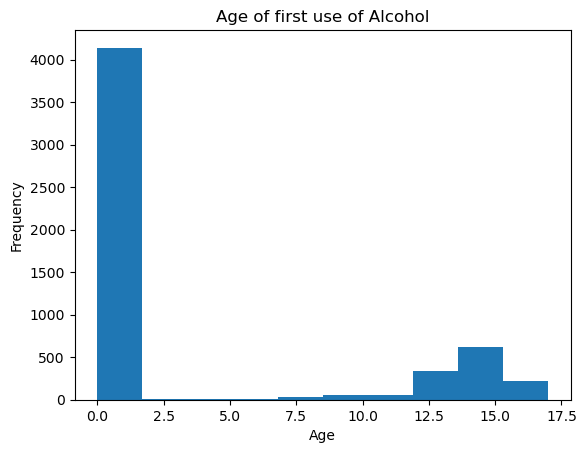

In [75]:
df_regressor['age_first_alcohol_use'].hist(grid = 
                                          False)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age of first use of Alcohol')

In [76]:
# having the first alcohol age below age of 6 is unheard of . Let's make these as 7.
df_impute['age_first_alcohol_use'].value_counts()

991.0    4138
15.0      329
14.0      291
13.0      225
16.0      166
12.0      112
11.0       61
17.0       57
10.0       36
9.0        21
8.0        19
7.0        17
6.0         9
5.0         6
3.0         5
4.0         5
2.0         2
1.0         1
Name: age_first_alcohol_use, dtype: int64

In [77]:
# replace values 1-6 with 7 in the 'age_first_alcohol_age' column
df_regressor['age_first_alcohol_use'] = df_regressor['age_first_alcohol_use'].replace([1, 2, 3, 4, 5, 6], 7)

In [78]:
df_regressor['age_first_alcohol_use'].value_counts()

0.0     4138
15.0     329
14.0     291
13.0     225
16.0     166
12.0     112
11.0      61
17.0      57
7.0       45
10.0      36
9.0       21
8.0       19
Name: age_first_alcohol_use, dtype: int64

In [79]:
for col in df_regressor.columns[:-2]:
    convert_to_category(df_regressor,col)
    df_regressor= onehotencoding(df_regressor,col)

In [80]:
X = df_regressor[df_regressor.columns.difference(['alcohol_frequency_past_year','age_first_alcohol_use'])]
y = df_regressor['age_first_alcohol_use']

In [81]:
# fit decision tree model
tree_mar = DecisionTreeRegressor()
tree_mar.fit(X, y)

DecisionTreeRegressor()

In [82]:
tree_summary = export_text(tree_mar, feature_names=X.columns.tolist())
#print(tree_summary)

In [83]:
importances = pd.DataFrame({'feature_name': X.columns, 'importance': tree_mar.feature_importances_})
importances = importances.sort_values('importance', ascending=False).reset_index(drop=True)
print(importances)

                                 feature_name  importance
0                        alcohol_use_flag_0.0    0.972885
1         serious_fight_at_school_or_work_2.0    0.001563
2         arguments_or_fights_with_parent_2.0    0.001226
3            participated_in_skills_group_1.0    0.001151
4            religious_service_attendance_1.0    0.001135
..                                        ...         ...
67                       alcohol_use_flag_1.0    0.000000
68  religious_beliefs_influence_decisions_0.0    0.000000
69          homework_monitoring_by_parent_0.0    0.000000
70      days_missed_school_from_skipping_11.0    0.000000
71                parent_praise_for_youth_0.0    0.000000

[72 rows x 2 columns]


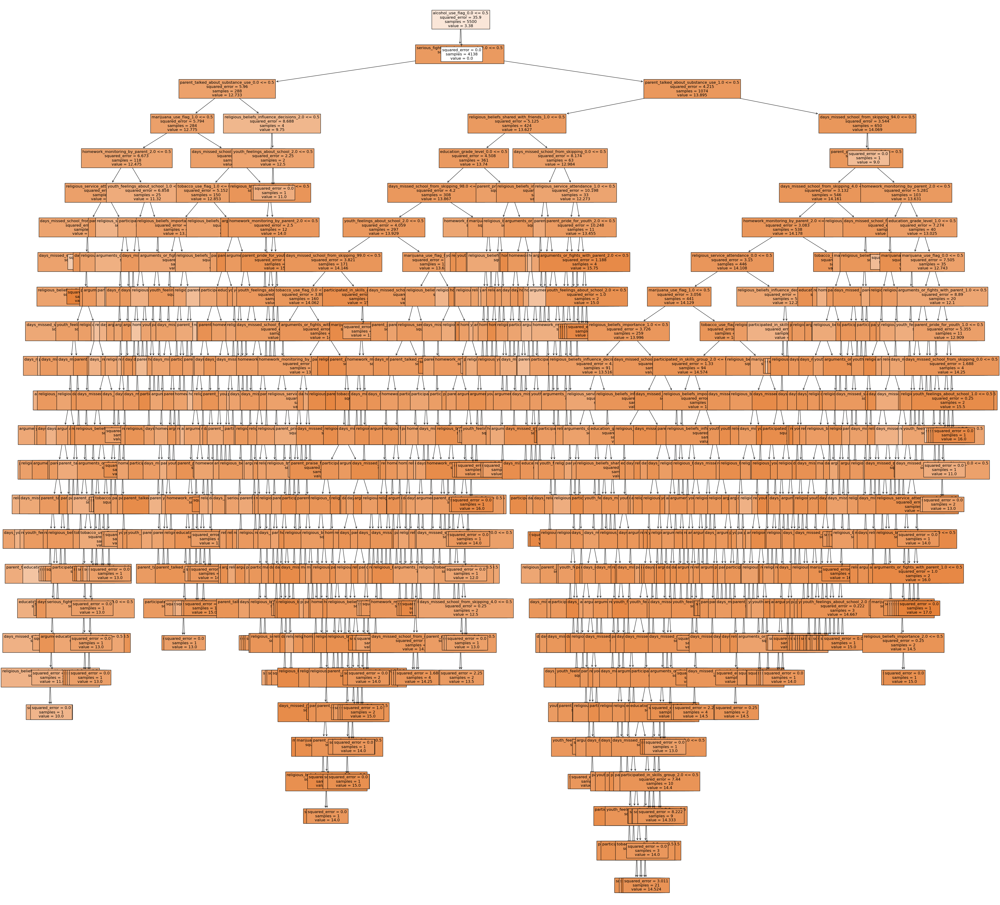

In [84]:
plt.figure(figsize=(50,50))
plot_tree(tree_mar
          , filled=True
          , feature_names=X.columns
          #, class_names=[0, 1]
          , label='all'
          , fontsize=12)
plt.show()

The above output looks too messy to visualize. Let's see what output we are getting after running the model for the training dataset

### Let's try different models to predict the alcohol usage based on various parameters

##### Simple Decision Classifier

###### since the data is imbalanced, we will do stratify sampling and see how it performs

#### Let's try Random Forest Classifier and see how it works in the training and test dataset

Mean Squared Error: 1.14


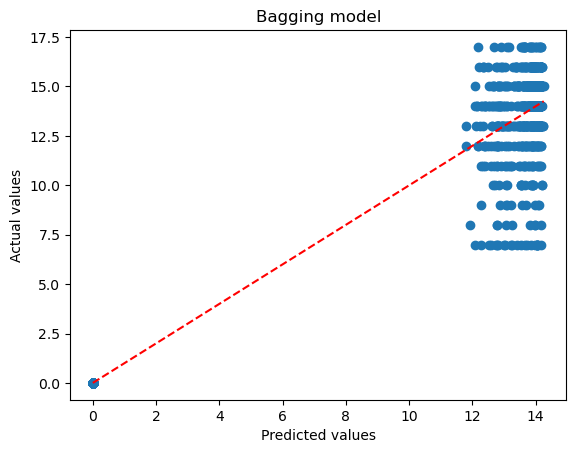

In [85]:
# Split the Data between test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=2, stratify=y)


# create Random Forest model with class_weight parameter
rf_model = RandomForestRegressor(n_estimators=5000, max_depth=4
                                         , random_state=1
                                         )

# fit Random Forest model
rf_model.fit(X_train, y_train)

# predict on test data
rf_pred = rf_model.predict(X_test)

# plot predicted vs actual values
plt.scatter(rf_pred, y_test)
plt.plot([min(rf_pred), max(rf_pred)], [min(rf_pred), max(rf_pred)], 'r--')
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Bagging model');
# find the MSE
print("Mean Squared Error: {:.2f}".format(mean_squared_error(y_test, rf_pred)))

### Let's try bagging approach 

In [86]:
# fit Random Forests model
alcohol_bagging = RandomForestRegressor(max_features=X_train.shape[1],random_state = 2)
alcohol_bagging.fit(X_train,y_train)

print("Number of trees:", alcohol_bagging.n_estimators)
print("Number of features tried at each split:",alcohol_bagging.max_features)
print("Training score: {:.2f}%".format(alcohol_bagging.score(X_train,y_train)*100))

Number of trees: 100
Number of features tried at each split: 72
Training score: 99.09%


Mean Squared Error: 1.35


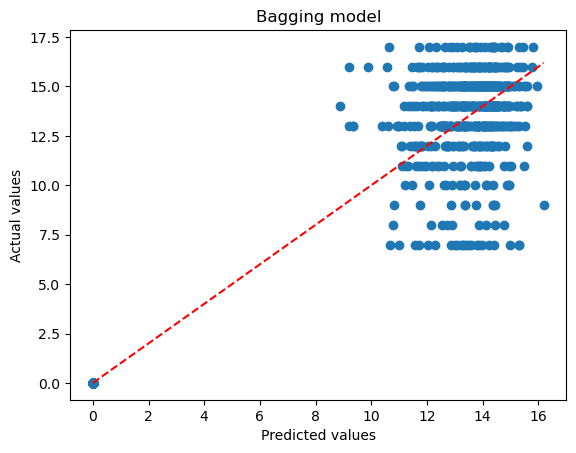

In [87]:
# Predict values
y_pred_bag = alcohol_bagging.predict(X_test)

# plot predicted vs actual values
plt.scatter(y_pred_bag, y_test)
plt.plot([min(y_pred_bag), max(y_pred_bag)], [min(y_pred_bag), max(y_pred_bag)], 'r--')
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Bagging model');
# find the MSE
print("Mean Squared Error: {:.2f}".format(mean_squared_error(y_test, y_pred_bag)))

In [88]:
# Calculate the accuracy of the decision tree on the test data
accuracy = alcohol_bagging.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 96.25%


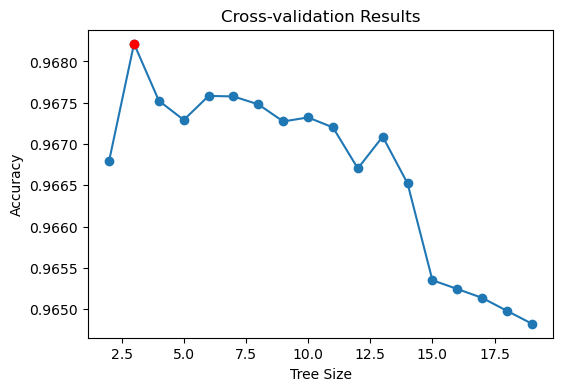

In [89]:
# fit decision tree model
tree_mar = DecisionTreeRegressor(random_state=7)
tree_mar.fit(X_train, y_train)

# cross-validation to determine optimal tree size
params = {'max_leaf_nodes': range(2, 20)}  
cv_mar = GridSearchCV(tree_mar, params, cv=10)
cv_mar.fit(X_train, y_train)
cv_results = cv_mar.cv_results_

# find the best score for max leaf nodes
best_size = cv_mar.best_params_['max_leaf_nodes']
best_score = cv_mar.best_score_

# plot results of cross-validation
plt.figure(figsize=(6, 4))
plt.plot(cv_results["param_max_leaf_nodes"], cv_results["mean_test_score"], 'o-')
plt.plot(best_size, best_score, 'ro-')
plt.xlabel('Tree Size')
plt.ylabel('Accuracy')
plt.title('Cross-validation Results');


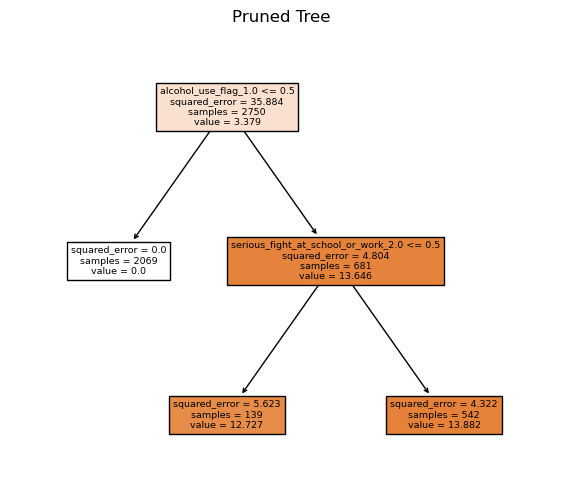

In [90]:
# prune tree using optimal size
prune_mar = DecisionTreeRegressor(max_leaf_nodes=best_size, random_state=7)
prune_mar.fit(X_train, y_train)

# plot pruned tree
plt.figure(figsize=(7,6))

plot_tree(prune_mar, feature_names=X_train.columns, filled=True)
plt.title('Pruned Tree');

In [91]:
# Calculate the accuracy of the decision tree on the test data
accuracy = prune_mar.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 96.84%


In [92]:
# fit Gradient Boosting model
boost_alcohol = GradientBoostingRegressor(n_estimators=5000, max_depth=4
                                         , random_state=1)
boost_alcohol.fit(X_train, y_train)

GradientBoostingRegressor(max_depth=4, n_estimators=5000, random_state=1)

In [93]:
# create a dataframe of feature importances and their corresponding column names
importances_boost_alcohol = pd.DataFrame({'Feature': X_train.columns, 'Importance': boost_alcohol.feature_importances_})
importances_boost_alcohol = importances_boost_alcohol.sort_values('Importance', ascending=False).reset_index(drop=True)

# display the table
print(importances_boost_alcohol)

                                      Feature    Importance
0                        alcohol_use_flag_1.0  5.548216e-01
1                        alcohol_use_flag_0.0  4.237421e-01
2         serious_fight_at_school_or_work_2.0  1.523897e-03
3   religious_beliefs_shared_with_friends_1.0  8.815725e-04
4                 parent_praise_for_youth_2.0  8.725426e-04
..                                        ...           ...
67      days_missed_school_from_skipping_16.0  5.800253e-08
68      days_missed_school_from_skipping_22.0  5.747186e-08
69      days_missed_school_from_skipping_97.0  4.897885e-09
70      days_missed_school_from_skipping_14.0  0.000000e+00
71      days_missed_school_from_skipping_11.0  0.000000e+00

[72 rows x 2 columns]


Mean Squared Error: 1.85


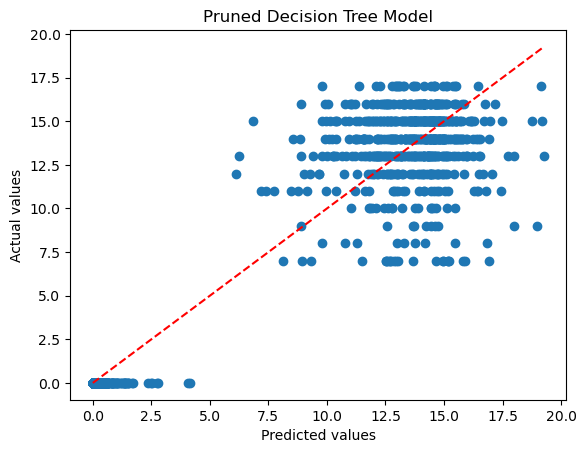

In [94]:
# obtain predicted labels for test set
y_pred = boost_alcohol.predict(X_test)
y_pred = np.clip(y_pred, 0, 365)
# plot predicted vs actual values
plt.scatter(y_pred, y_test)
plt.plot([min(y_pred), max(y_pred)], [min(y_pred), max(y_pred)], 'r--')
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Pruned Decision Tree Model');
# find the MSE
print("Mean Squared Error: {:.2f}".format(mean_squared_error(y_test, y_pred)))